## “Daily” Data Analysis for a Product listed on Amazon

### Business Objective:
Need to get daily Analysis of a product such as emotions, sentiment etc. using Amazon data .It could be any product of your choice. 

### Architecture level analysis:
* Need to pull the data of a product from Amazon
* Data transformation/Text processing using R/Python
* Need to get daily product sentiments Analysis and Emotion mining with some charts like histogram, Density plot, Barplot, pie-plot etc. 
* Deployment through R Shiny or Flask/ Streamlit


##  Web Scraping
*  Pulling the data of a product from Amazon

### Echo dot 3rd generation

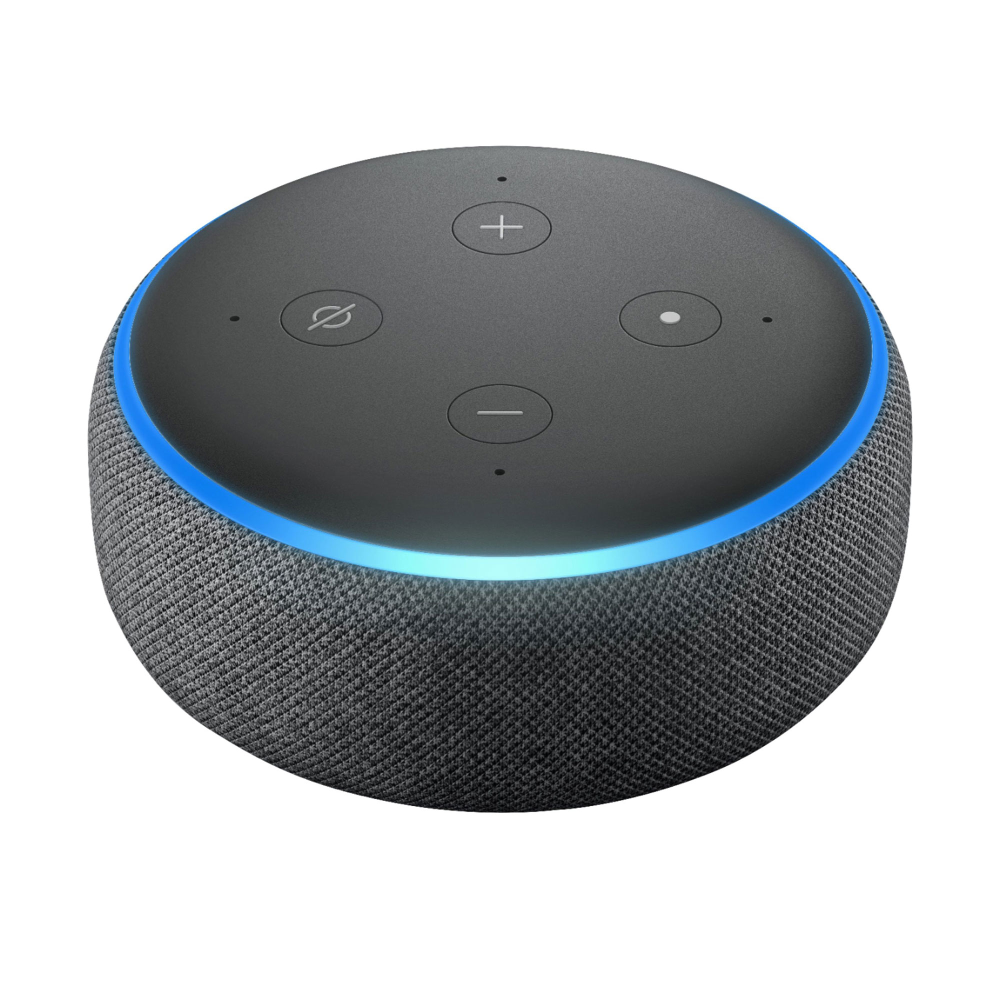

## Table of Contents:
**The contents of this project are divided into various categories which are given as follows:-**

 *1. Web Scraping and getting the data*
 
 *2. Importing Necessary Libraries*
 
 *3. Import Data*
 
 *4. Exploratory Data Analysis*
 
     4.1 Visualizations (With whole dataset)
    
     4.2 Visualizations (With plotly,After selecting some important features)
   *After Selecting some Important Features*
   
      1. Polarity
      2. review_len
      3. word_count
      4. avg_word_len
   *5. Sentiment Analysis*
   
   *6. Text Cleaning And Preprocessing*
   
   *7. Feature Extraction*
   
   *8. Named Entity Recognition*
   
   *9. Model Building*

## 1. Web Scraping And getting the data

### For Web Scraping techniques we have used 
* Beautiful soup
* Scrapy

## 2. Importing Necessary Libraries

In [3]:
!pip install textblob

In [4]:
!pip install plotly

In [5]:
!pip install cufflinks

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly as py
from plotly.offline import iplot
import cufflinks as cf
from textblob import TextBlob

import nltk
import spacy
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.linear_model import LogisticRegression
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings('ignore')

In [2]:
py.offline.init_notebook_mode(connected=True)
cf.go_offline()

## 3. Import Data

In [3]:
df=pd.read_csv('AmazonSpeakerReviewRefined.csv.xls')
df.head(10)

,Name,Stars,Reviewed_Country,Date,Verified,HelpfulVotes,Title,Review
0,Parag,1,India,19/10/2018,False,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...
1,Chinmaya D.,5,India,15/10/2018,False,2965,My first Smart Speaker,This was launched on 11th and I got the produc...
2,Vishnu,5,India,22/12/2018,False,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...
3,Rajiv p.,4,India,15/10/2018,False,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...
4,Aritra Daspoddar,4,India,19/02/2019,False,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...
5,CoffeeNCam,5,India,26/10/2018,False,149,"Finally, a smart ""speaker""","I got it on sale for 3k. For the price, it off..."
6,Rimple Sethi,2,India,21/10/2018,False,153,Good music player but poor assistant,Rate of speech cannot be altered. Specially in...
7,Kumar Gautam,1,India,13/10/2021,False,71,Not satisfied with the wipro smart bulb its no...,I bought this product to gift some one else an...
8,One of Amazon lover🎭,4,India,25/08/2021,False,61,Good Alexa with 'incompatible' smart wipro💡,Alexa is very good but came with defective sma...
9,Amrish,1,India,15/10/2018,False,128,it does not support fire TV,This device does not have integration with Fir...


## 4. Exploratory Data Analysis

### 4.1 Data Wrangling

In [4]:
#Checking the null values
df.isnull().sum()

Name                0
Stars               0
Reviewed_Country    0
Date                0
Verified            0
HelpfulVotes        0
Title               0
Review              0
dtype: int64

In [5]:
#To describe the descriptive statistics
df.describe()

,Stars,HelpfulVotes
count,5000.000000,5000.000000
mean,3.887200,2.128200
std,1.425932,55.453205
min,1.000000,0.000000
25%,3.000000,0.000000
50%,5.000000,0.000000
75%,5.000000,0.000000
max,5.000000,2965.000000


In [6]:
#To check the datatypes
df.dtypes

Name                object
Stars                int64
Reviewed_Country    object
Date                object
Verified              bool
HelpfulVotes         int64
Title               object
Review              object
dtype: object

In [7]:
#Converting the 'object' data type into 'Datetime' data type
df['Date']=pd.to_datetime(df['Date'])

In [8]:
df.dtypes

Name                        object
Stars                        int64
Reviewed_Country            object
Date                datetime64[ns]
Verified                      bool
HelpfulVotes                 int64
Title                       object
Review                      object
dtype: object

In [9]:
#Adding the year feature into the dataset
df['Year']= pd.DatetimeIndex(df['Date']).year

In [10]:
df.head()

,Name,Stars,Reviewed_Country,Date,Verified,HelpfulVotes,Title,Review,Year
0,Parag,1,India,2018-10-19,False,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,2018
1,Chinmaya D.,5,India,2018-10-15,False,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,2018
2,Vishnu,5,India,2018-12-22,False,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,2018
3,Rajiv p.,4,India,2018-10-15,False,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,2018
4,Aritra Daspoddar,4,India,2019-02-19,False,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,2019


## Visualizations - 1
   With Whole Dataset

### Visualizing which year has more number of reviews

<AxesSubplot:xlabel='Year', ylabel='count'>

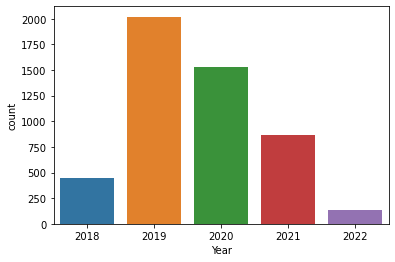

In [11]:
sns.countplot('Year', data=df)

## Inference:
  #### So in the year 2019 & 2020 we got more number of reviews for our product

### Visualizing number of customers given number of ratings

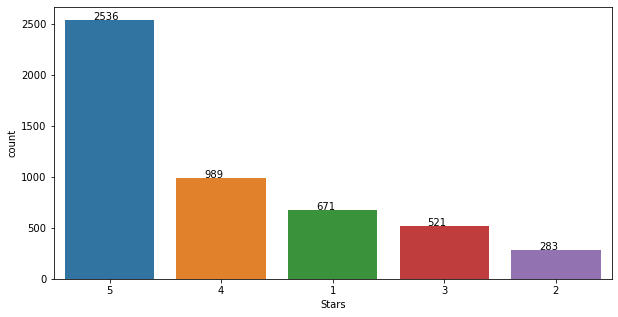

In [12]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x=df["Stars"],  data=df, order = df["Stars"].value_counts().index )
for p, label in zip(ax.patches, df["Stars"].value_counts()):   
    ax.annotate(label, (p.get_x()+0.25, p.get_height()+0.5))

## Inference:
   #### Therefore 2536 customers has given 5 star ratings on our product

In [13]:
df.groupby('HelpfulVotes').size()

HelpfulVotes
0       3895
1        763
2        171
3         53
4         22
5         11
6         11
7         14
8          3
9          7
10         3
11         4
12         3
13         2
14         1
15         1
17         2
18         1
19         3
20         1
22         1
25         1
27         1
31         1
33         1
42         1
46         1
47         1
51         4
61         1
63         1
69         1
71         1
83         1
85         1
95         1
96         1
104        1
128        1
149        1
153        1
233        1
647        1
962        1
2248       1
2965       1
dtype: int64

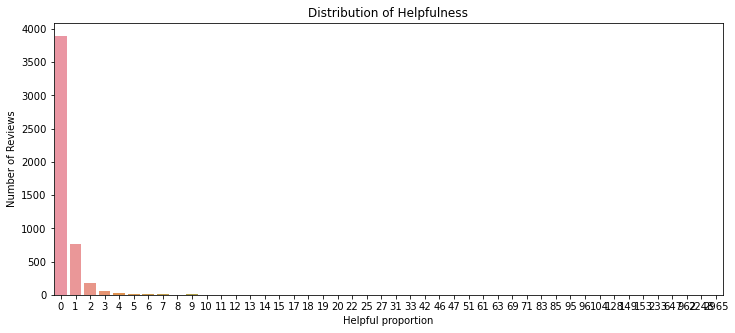

In [14]:
plt.figure(figsize=(12,5))


sns.countplot('HelpfulVotes' , data=df)

plt.title("Distribution of Helpfulness")
plt.xlabel("Helpful proportion")
plt.ylabel("Number of Reviews")
plt.xticks(rotation=0)
plt.show()

### Selecting some important features

In [15]:
#Creating a copy of dataset
df1=df.copy()

In [16]:
#Dropping some unuseful features
df1.drop(labels=["Reviewed_Country","Date","Verified","Year"],axis=1,inplace=True)

In [17]:
df1.head()

,Name,Stars,HelpfulVotes,Title,Review
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...


In [18]:
df1.columns

Index(['Name', 'Stars', 'HelpfulVotes', 'Title', 'Review'], dtype='object')

In [19]:
review_data=df1['Review']
review_data

0       It definitely has better speakers than Eco Dot...
1       This was launched on 11th and I got the produc...
2       The media could not be loaded.  Such an amazin...
3       It's totally Paisa wasoolSpeaker is loudShe li...
4       At first i was confused which one to buy - Goo...
                              ...                        
4995                                            Excellent
4996    It's been 9 months and it's working smooth wit...
4997    Please add a feature to connect multiple devic...
4998    It still fails to make Cellular calls n much m...
4999                           given as a gift to brother
Name: Review, Length: 5000, dtype: object

## Polarity of the Reviews

### TextBlob :
   **TextBlob returns polarity** and subjectivity of a sentence. Polarity lies between **[-1,1]**

### Polarity:
   Text polarity is a measure of how negative or how positive a piece of text is. Polarity is the measure of the overall combination of the **positive and negative emotions in a sentence**.

In [20]:
from textblob import TextBlob

In [21]:
df1['Polarity']=df1['Review'].apply(lambda x: TextBlob(x).sentiment.polarity)
df1

,Name,Stars,HelpfulVotes,Title,Review,Polarity
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869
...,...,...,...,...,...,...
4995,vanisree vanamali,5,0,Excellent,Excellent,1.000000
4996,asmit gangil,5,0,Amazing product,It's been 9 months and it's working smooth wit...,0.100000
4997,Mueem,3,0,Missing some features. OVERALL good product,Please add a feature to connect multiple devic...,0.000000
4998,Yogesh gowda,5,0,Best for Indians but,It still fails to make Cellular calls n much m...,0.000000


### Review length and Word count

In [22]:
df1['review_len'] = df1['Review'].apply(lambda x: len(x))
df1['word_count'] = df1['Review'].apply(lambda x: len(x.split()))

In [23]:
def get_avg_word_len(x):
    words = x.split()
    word_len = 0
    for word in words:
        word_len = word_len + len(word)
        
    return word_len/len(words) 

In [24]:
df1['avg_word_len'] = df1['Review'].apply(lambda x: get_avg_word_len(x))
df1.head(10)

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191,946,170,4.570588
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634,840,157,4.356688
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778,496,97,4.113402
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500,187,32,4.875000
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869,1220,209,4.842105
5,CoffeeNCam,5,149,"Finally, a smart ""speaker""","I got it on sale for 3k. For the price, it off...",0.269874,766,142,4.401408
6,Rimple Sethi,2,153,Good music player but poor assistant,Rate of speech cannot be altered. Specially in...,0.171429,418,64,5.546875
7,Kumar Gautam,1,71,Not satisfied with the wipro smart bulb its no...,I bought this product to gift some one else an...,0.357143,165,31,4.354839
8,One of Amazon lover🎭,4,61,Good Alexa with 'incompatible' smart wipro💡,Alexa is very good but came with defective sma...,0.349714,202,38,4.342105
9,Amrish,1,128,it does not support fire TV,This device does not have integration with Fir...,0.046429,259,48,4.416667


## Visualization -2
After selecting the useful columns

In [25]:
#cufflinks is package with pandas and plotlib
df1['Polarity'].iplot()

### Inference:
   From this we can see the polarity score of each review as we move our cursor point, And most of the reviews polarity score is above neutral and positive

In [26]:
df1['Polarity'].iplot(kind='hist',colors = 'black',bins = 50,title='sentiment Polarity',
    xTitle='Polarity',
    yTitle='Count')

### Inference:
   Polarity score of reviews according to the word count

In [27]:
df1['review_len'].iplot(kind='hist',bins=50,colors = 'black',title='review_len Distribution',
    xTitle='review_len',
    yTitle='Count')

In [28]:
df1['word_count'].iplot(kind='hist',colors = 'gray',title='word_count Distribution',
    xTitle='word_count',
    yTitle='Count')

In [29]:
df1['avg_word_len'].iplot(kind='hist',title='avg_word_len Distribution',
    xTitle='avg_word_len',
    yTitle='Count')

In [30]:
df1['word_count'].iplot(kind='box',colors = 'black',title='word_count Distribution',
    xTitle='word_count',
    yTitle='Count')

In [31]:
df1['Stars'].value_counts().iplot(kind='hist',colors = 'black',title='Rating Distribution',
    xTitle='Count',
    yTitle='Rating')

## 5. Sentiment Analysis
   Sentiment Analysis, as the name suggests, it means to identify the view or emotion behind a situation.
   * It basically means to analyze and find the emotion or intent behind a piece of text or speech or any mode of communication
   * especially in order to determine whether the writer's attitude towards a particular topic, product, etc. is positive, negative, or neutral.

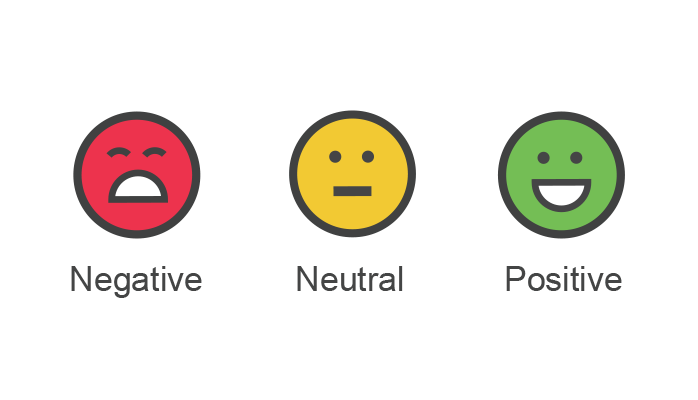

In [32]:
#Defining Sentiment values with Stars(Ratings)
def sentiment(Stars):
    if Stars>3:
        return 'Positive'
    elif Stars==3:
        return 'Neutral'
    else:
        return 'Negative'

In [33]:
df1['Sentiment(Stars)']=df['Stars'].apply(sentiment)

In [34]:
df1.tail()

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len,Sentiment(Stars)
4995,vanisree vanamali,5,0,Excellent,Excellent,1.0,9,1,9.000000,Positive
4996,asmit gangil,5,0,Amazing product,It's been 9 months and it's working smooth wit...,0.1,63,11,4.818182,Positive
4997,Mueem,3,0,Missing some features. OVERALL good product,Please add a feature to connect multiple devic...,0.0,116,19,5.157895,Neutral
4998,Yogesh gowda,5,0,Best for Indians but,It still fails to make Cellular calls n much m...,0.0,52,10,4.300000,Positive
4999,Ramprasad,5,0,good one,given as a gift to brother,0.0,26,6,3.500000,Positive


In [35]:
#Defining Sentiment value with Polarity Score
def sentiment(Polarity):
    if Polarity>0.0:
        return 'Positive'
    elif Polarity==0.0:
        return 'Neutral'
    else:
        return 'Negative'

In [36]:
df1['sentiment(Polarity)']=df1['Polarity'].apply(sentiment)

In [37]:
df1.head()

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len,Sentiment(Stars),sentiment(Polarity)
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191,946,170,4.570588,Negative,Negative
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634,840,157,4.356688,Positive,Positive
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778,496,97,4.113402,Positive,Positive
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500,187,32,4.875000,Positive,Positive
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869,1220,209,4.842105,Positive,Positive


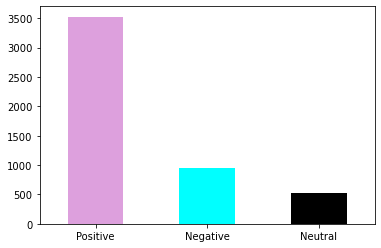

In [38]:
#Visualizing Positive, Negative, Neutral sentiments with Stars
result=df1['Sentiment(Stars)'].value_counts()
result.plot(kind='bar', rot=0, color=['plum','cyan','black']);

In [39]:
#Count of Positive, Negative, Neutral sentiments with Stars
temp = df1.groupby('Sentiment(Stars)').count()['Stars'].reset_index().sort_values(by='Stars',ascending=False)
temp.style.background_gradient(cmap='Purples')

,Sentiment(Stars),Stars
2,Positive,3525
0,Negative,954
1,Neutral,521


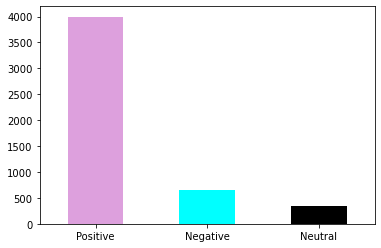

In [40]:
#Visualizing Positive, Negative, Neutral sentiments with Polarity Score
result=df1['sentiment(Polarity)'].value_counts()
result.plot(kind='bar', rot=0, color=['plum','cyan','black']);

In [41]:
#Count of Positive, Negative, Neutral sentiments with Stars
temp = df1.groupby('sentiment(Polarity)').count()['Stars'].reset_index().sort_values(by='Stars',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment(Polarity),Stars
2,Positive,3996
0,Negative,659
1,Neutral,345


### Inference:
   So we can see by the **sentiment value of the reviews**,with polarity score and also with Stars. most of the **reviews about the product is Positive** then **Negative** and **very less are Neutral**

In [42]:
df1.head()

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len,Sentiment(Stars),sentiment(Polarity)
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191,946,170,4.570588,Negative,Negative
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634,840,157,4.356688,Positive,Positive
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778,496,97,4.113402,Positive,Positive
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500,187,32,4.875000,Positive,Positive
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869,1220,209,4.842105,Positive,Positive


In [43]:
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff

In [44]:
positive_sent=df1[df1['sentiment(Polarity)']=='Positive']
negative_sent=df1[df1['sentiment(Polarity)']=='Negative']
neutral_sent=df1[df1['sentiment(Polarity)']=='Neutral']

In [45]:
from collections import Counter

In [46]:
df1.head()

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len,Sentiment(Stars),sentiment(Polarity)
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191,946,170,4.570588,Negative,Negative
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634,840,157,4.356688,Positive,Positive
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778,496,97,4.113402,Positive,Positive
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500,187,32,4.875000,Positive,Positive
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869,1220,209,4.842105,Positive,Positive





## 6. Text Cleaning and Preprocessing

In [47]:
#Joining the List into One single String/Text
sentence=''.join(review_data)
sentence

'It definitely has better speakers than Eco Dot Gen2 and Google Home Mini, but sound recognition is very poor compared to Google Home Mini or even previous Eco Dot. Maybe it has something to do with cost cutting and Amazon going with only 4 far field microphones instead of 7.But due to it\'s poor recognition, it takes a lot of time, sometimes even minutes and does nothing... Which definitely takes away the experience. Unfortunately I can\'t return it... But I think Google Home Mini is miles ahead and better with all the new updates to Google Assistant (Sleep assist and stuff).Update as on 27th April 2019: Software has gone from bad to worst. It plays certain songs again and again, doesn\'t let you skip. Recognition has also gone from bad to worst, you have to yell for Alexa to understand what you want it to do only for it to tell you it doesn\'t understand what you said. And expect no support from Amazon about eco devices, it\'s very bad.This was launched on 11th and I got the product 

## Replacing The Contractions

### Contractions:
Contractions are words or combinations of words which are shortened by dropping letters and replacing them by an apostrophe. Let’s have a look at some examples:
we’re = we are; we’ve = we have; I’d = I would

In [48]:
!pip install contractions

In [49]:
import sys

In [50]:
!{sys.executable} -m pip install contractions

In [51]:
#Import Library
import contractions

In [52]:
Apos_dict= { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [53]:
#Replace the contractions
for key,value in Apos_dict.items():
    if key in sentence:
        sentence=sentence.replace(key,value)
        
print("After contraction replacement the reviewed sentence is:-\n{}".format(sentence))   

After contraction replacement the reviewed sentence is:-
It definitely has better speakers than Eco Dot Gen2 and Google Home Mini, but sound recognition is very poor compared to Google Home Mini or even previous Eco Dot. Maybe it has something to do with cost cutting and Amazon going with only 4 far field microphones instead of 7.But due to it has / it is poor recognition, it takes a lot of time, sometimes even minutes and does nothing... Which definitely takes away the experience. Unfortunately I cannot return it... But I think Google Home Mini is miles ahead and better with all the new updates to Google Assistant (Sleep assist and stuff).Update as on 27th April 2019: Software has gone from bad to worst. It plays certain songs again and again, does not let you skip. Recognition has also gone from bad to worst, you have to yell for Alexa to understand what you want it to do only for it to tell you it does not understand what you said. And expect no support from Amazon about eco devices

## Library used for Preprocessing the data

#### NLTK
NLTK (Natural Language Toolkit) Library is a suite that contains libraries and programs for statistical language processing. It is one of the most powerful NLP libraries which contains
* Tokenization
* Stop-words
* Stemming
* Tagging Parts of Speech (pos)


## Tokenization
* Splitting/Breaking the text into words

In [54]:
import warnings
warnings.filterwarnings('ignore')

In [55]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(sentence)
print(text_tokens)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\shaik\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


['It', 'definitely', 'has', 'better', 'speakers', 'than', 'Eco', 'Dot', 'Gen2', 'and', 'Google', 'Home', 'Mini', ',', 'but', 'sound', 'recognition', 'is', 'very', 'poor', 'compared', 'to', 'Google', 'Home', 'Mini', 'or', 'even', 'previous', 'Eco', 'Dot', '.', 'Maybe', 'it', 'has', 'something', 'to', 'do', 'with', 'cost', 'cutting', 'and', 'Amazon', 'going', 'with', 'only', '4', 'far', 'field', 'microphones', 'instead', 'of', '7.But', 'due', 'to', 'it', 'has', '/', 'it', 'is', 'poor', 'recognition', ',', 'it', 'takes', 'a', 'lot', 'of', 'time', ',', 'sometimes', 'even', 'minutes', 'and', 'does', 'nothing', '...', 'Which', 'definitely', 'takes', 'away', 'the', 'experience', '.', 'Unfortunately', 'I', 'can', 'not', 'return', 'it', '...', 'But', 'I', 'think', 'Google', 'Home', 'Mini', 'is', 'miles', 'ahead', 'and', 'better', 'with', 'all', 'the', 'new', 'updates', 'to', 'Google', 'Assistant', '(', 'Sleep', 'assist', 'and', 'stuff', ')', '.Update', 'as', 'on', '27th', 'April', '2019', ':', 

In [56]:
#count of words
len(text_tokens)

205176

In [57]:
import string

In [58]:
#Removing Punctuations
no_punc_text=sentence.translate(str.maketrans('','',string.punctuation))
no_punc_text

'It definitely has better speakers than Eco Dot Gen2 and Google Home Mini but sound recognition is very poor compared to Google Home Mini or even previous Eco Dot Maybe it has something to do with cost cutting and Amazon going with only 4 far field microphones instead of 7But due to it has  it is poor recognition it takes a lot of time sometimes even minutes and does nothing Which definitely takes away the experience Unfortunately I cannot return it But I think Google Home Mini is miles ahead and better with all the new updates to Google Assistant Sleep assist and stuffUpdate as on 27th April 2019 Software has gone from bad to worst It plays certain songs again and again does not let you skip Recognition has also gone from bad to worst you have to yell for Alexa to understand what you want it to do only for it to tell you it does not understand what you said And expect no support from Amazon about eco devices it has  it is very badThis was launched on 11th and I got the product by 12th

## Remove Stop Words
The words that doesn't bare any information/Meaning on its own.And depends on prior and superior Words

In [59]:
#Importing the stopwords
from nltk.corpus import stopwords

In [60]:
#View the stopwords
my_stop_words=stopwords.words('english')
my_stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [61]:
#removing the stopwords
no_stop_tokens= [word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['It', 'definitely', 'better', 'speakers', 'Eco', 'Dot', 'Gen2', 'Google', 'Home', 'Mini', ',', 'sound', 'recognition', 'poor', 'compared', 'Google', 'Home', 'Mini', 'even', 'previous', 'Eco', 'Dot', '.', 'Maybe', 'something', 'cost', 'cutting', 'Amazon', 'going', '4', 'far', 'field', 'microphones', 'instead', '7.But', 'due', '/', 'poor', 'recognition', ',', 'takes', 'lot', 'time', ',', 'sometimes', 'even', 'minutes', 'nothing', '...', 'Which', 'definitely', 'takes', 'away', 'experience', '.', 'Unfortunately', 'I', 'return', '...', 'But', 'I', 'think', 'Google', 'Home', 'Mini', 'miles', 'ahead', 'better', 'new', 'updates', 'Google', 'Assistant', '(', 'Sleep', 'assist', 'stuff', ')', '.Update', '27th', 'April', '2019', ':', 'Software', 'gone', 'bad', 'worst', '.', 'It', 'plays', 'certain', 'songs', ',', 'let', 'skip', '.', 'Recognition', 'also', 'gone', 'bad', 'worst', ',', 'yell', 'Alexa', 'understand', 'want', 'tell', 'understand', 'said', '.', 'And', 'expect', 'support', 'Amazon', 'e

## Normalization
Converting the text into LowerCase

In [62]:
lower_words= [Text.lower() for Text in no_stop_tokens]
print(lower_words)

['it', 'definitely', 'better', 'speakers', 'eco', 'dot', 'gen2', 'google', 'home', 'mini', ',', 'sound', 'recognition', 'poor', 'compared', 'google', 'home', 'mini', 'even', 'previous', 'eco', 'dot', '.', 'maybe', 'something', 'cost', 'cutting', 'amazon', 'going', '4', 'far', 'field', 'microphones', 'instead', '7.but', 'due', '/', 'poor', 'recognition', ',', 'takes', 'lot', 'time', ',', 'sometimes', 'even', 'minutes', 'nothing', '...', 'which', 'definitely', 'takes', 'away', 'experience', '.', 'unfortunately', 'i', 'return', '...', 'but', 'i', 'think', 'google', 'home', 'mini', 'miles', 'ahead', 'better', 'new', 'updates', 'google', 'assistant', '(', 'sleep', 'assist', 'stuff', ')', '.update', '27th', 'april', '2019', ':', 'software', 'gone', 'bad', 'worst', '.', 'it', 'plays', 'certain', 'songs', ',', 'let', 'skip', '.', 'recognition', 'also', 'gone', 'bad', 'worst', ',', 'yell', 'alexa', 'understand', 'want', 'tell', 'understand', 'said', '.', 'and', 'expect', 'support', 'amazon', 'e

## Stemming
* Stemming removes the suffix of the word and converts it to a base word

#### Porter stemming algorithm
It is one of the most common stemming algorithms which is basically designed to remove and replace well-known suffixes of English words.

In [63]:
from nltk.stem import PorterStemmer
ps = PorterStemmer()
stemmed_tokens= [ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['it', 'definit', 'better', 'speaker', 'eco', 'dot', 'gen2', 'googl', 'home', 'mini', ',', 'sound', 'recognit', 'poor', 'compar', 'googl', 'home', 'mini', 'even', 'previou', 'eco', 'dot', '.', 'mayb', 'someth', 'cost', 'cut', 'amazon', 'go', '4', 'far', 'field', 'microphon', 'instead', '7.but', 'due', '/', 'poor', 'recognit', ',', 'take', 'lot', 'time', ',', 'sometim', 'even', 'minut', 'noth', '...', 'which', 'definit', 'take', 'away', 'experi', '.', 'unfortun', 'i', 'return', '...', 'but', 'i', 'think', 'googl', 'home', 'mini', 'mile', 'ahead', 'better', 'new', 'updat', 'googl', 'assist', '(', 'sleep', 'assist', 'stuff', ')', '.updat', '27th', 'april', '2019', ':', 'softwar', 'gone', 'bad', 'worst', '.', 'it', 'play', 'certain', 'song', ',', 'let', 'skip', '.', 'recognit', 'also', 'gone', 'bad', 'worst', ',', 'yell', 'alexa', 'understand', 'want', 'tell', 'understand', 'said', '.', 'and', 'expect', 'support', 'amazon', 'eco', 'devic', ',', '/', 'bad.thi', 'launch', '11th', 'i', 'got',

## Lemmatization
* The lemmatization algorithm removes affixes from the inflected words to convert them into the base words (lemma form). It is **Silimilar to Stemming Except that Lemmatization Converts into a meaningfull word where as Stemming just removes the suffixes**
* It uses **en_core_web_sm**

>**en_core_web_sm** is a small English pipeline trained on written web text (blogs, news, comments), that includes vocabulary, syntax and entities.

In [64]:
!python -m spacy download en_core_web_sm

     ---------------------------------------- 13.9/13.9 MB 3.5 MB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


### Lemmatization using spaCy. 
**Spacy :**
    It is one of the best text analysis library
* spaCy excels at large-scale **information extraction tasks**
* spaCy is much faster and accurate than NLTKTagger and TextBlob.

In [65]:
import spacy

In [66]:
from spacy.lang.en.examples import sentences
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

it definitely better speakers eco dot gen2 google home mini , sound recognition poor compared google home mini even previous eco dot . maybe something cost cutting amazon going 4 far field microphones instead 7.but due / poor recognition , takes lot time , sometimes even minutes nothing ... which definitely takes away experience . unfortunately i return ... but i think google home mini miles ahead better new updates google assistant ( sleep assist stuff ) .update 27th april 2019 : software gone bad worst . it plays certain songs , let skip . recognition also gone bad worst , yell alexa understand want tell understand said . and expect support amazon eco devices , / bad.this launched 11th i got product 12th . plus reduced price due sale nice smart bulb 500 rupees . overall i think super value money . i used smart speaker i happy purchase . below observations :1 . initially feels bit weird talking speaker get used time.2 . the sound quality pretty good . you get good depth sound decent b

In [67]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['it', 'definitely', 'well', 'speaker', 'eco', 'dot', 'gen2', 'google', 'home', 'mini', ',', 'sound', 'recognition', 'poor', 'compare', 'google', 'home', 'mini', 'even', 'previous', 'eco', 'dot', '.', 'maybe', 'something', 'cost', 'cut', 'amazon', 'go', '4', 'far', 'field', 'microphone', 'instead', '7.but', 'due', '/', 'poor', 'recognition', ',', 'take', 'lot', 'time', ',', 'sometimes', 'even', 'minute', 'nothing', '...', 'which', 'definitely', 'take', 'away', 'experience', '.', 'unfortunately', 'I', 'return', '...', 'but', 'I', 'think', 'google', 'home', 'mini', 'mile', 'ahead', 'well', 'new', 'update', 'google', 'assistant', '(', 'sleep', 'assist', 'stuff', ')', '.update', '27th', 'april', '2019', ':', 'software', 'go', 'bad', 'worst', '.', 'it', 'play', 'certain', 'song', ',', 'let', 'skip', '.', 'recognition', 'also', 'go', 'bad', 'worst', ',', 'yell', 'alexa', 'understand', 'want', 'tell', 'understand', 'say', '.', 'and', 'expect', 'support', 'amazon', 'eco', 'device', ',', '/', '

In [68]:
cleaned_reviews=''.join(lemmas)
cleaned_reviews

'itdefinitelywellspeakerecodotgen2googlehomemini,soundrecognitionpoorcomparegooglehomeminievenpreviousecodot.maybesomethingcostcutamazongo4farfieldmicrophoneinstead7.butdue/poorrecognition,takelottime,sometimesevenminutenothing...whichdefinitelytakeawayexperience.unfortunatelyIreturn...butIthinkgooglehomeminimileaheadwellnewupdategoogleassistant(sleepassiststuff).update27thapril2019:softwaregobadworst.itplaycertainsong,letskip.recognitionalsogobadworst,yellalexaunderstandwanttellunderstandsay.andexpectsupportamazonecodevice,/bad.thislaunch11thIgetproduct12th.plusreducepriceduesalenicesmartbulb500rupee.overallIthinksupervaluemoney.IusesmartspeakerIhappypurchase.belowobservation:1.initiallyfeelbitweirdtalkspeakergetusetime.2.thesoundqualityprettygood.yougetgooddepthsounddecentbass.3.severalskillavailabledefinitelyfinduseful.forexampleaddstuffshoppinglistsetreminder.4.understandindianaccentwell.sometimesIamazewellpickstuff.6.kidlove.anaddadvantagetakehelphomeworktalkalexaalsomotivatetalke

In [69]:
cleaned_data=pd.DataFrame(lemmas,columns=['words'])
cleaned_data

,words
0,it
1,definitely
2,well
3,speaker
4,eco
...,...
130884,much
130885,...
130886,give
130887,gift


## 7. Feature Extraction

### Using CountVectorizer
* CountVectorizer -It is a conversion of text data into a vector representation. Text data is pre-presented into the matrix.
* To convert into Binary Weights

## Distribution of Unigram,Bigram and Trigram
* With two and Three Consecutive words in a sentence

In [70]:
from sklearn.feature_extraction.text import CountVectorizer
# to count unique words...CountVectorizer takes a string in form of list

## Unigram

In [71]:
def get_top_n_words(x,n):
    vec = CountVectorizer(ngram_range=(1, 1),stop_words='english').fit(x)
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq,key = lambda x: x[1],reverse= True)
    return words_freq[:n]

In [72]:
#Top frequently repeated words after cleaning the data
words = get_top_n_words(df1['Review'],15)

Words=pd.DataFrame(words,columns=['Unigram','Frequency']).style.background_gradient(cmap="Blues")
Words

,Unigram,Frequency
0,alexa,2490
1,good,2116
2,product,1817
3,sound,1518
4,quality,1310
5,amazon,1268
6,voice,1068
7,echo,988
8,music,973
9,device,921


In [73]:

uni_df = pd.DataFrame(words, columns= ['Unigram','Frequency'])
uni_df= uni_df.set_index('Unigram')
uni_df.iplot(kind = 'bar',colors = 'Charcoal',title='Top 20 unigram words',
    xTitle='Unigram',
    yTitle='Count')

## Bigram

In [74]:
def get_top_n_words(x,n):
    vec = CountVectorizer(ngram_range=(2, 2),stop_words='english').fit(x)
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq,key = lambda x: x[1],reverse= True)
    return words_freq[:n]

In [75]:
words = get_top_n_words(df1['Review'],15)
pd.DataFrame(words,columns=['Bigrams','Frequency']).style.background_gradient(cmap="Blues")

,Bigrams,Frequency
0,sound quality,865
1,echo dot,663
2,voice recognition,391
3,google home,264
4,quality good,243
5,good product,204
6,smart bulb,147
7,amazon music,146
8,media loaded,138
9,alexa app,138


In [76]:
bi_df= pd.DataFrame(words, columns= ['Bigram','Frequency'])
bi_df= bi_df.set_index('Bigram')
bi_df.iplot(kind = 'bar',colors = 'Charcoal',title='Top 20 Bigram words',
    xTitle='Bigram',
    yTitle='Count')

## Trigram

In [77]:
def get_top_n_words(x,n):
    vec = CountVectorizer(ngram_range=(3, 3),stop_words='english').fit(x)
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq,key = lambda x: x[1],reverse= True)
    return words_freq[:n]

In [78]:
words = get_top_n_words(df1['Review'],15)
pd.DataFrame(words,columns=['Trigrams','Frequency']).style.background_gradient(cmap="Purples")

,Trigrams,Frequency
0,sound quality good,171
1,google home mini,117
2,echo dot 3rd,89
3,good sound quality,83
4,dot 3rd gen,58
5,voice recognition good,54
6,amazon echo dot,50
7,wipro smart bulb,49
8,alexa echo dot,39
9,dot 3rd generation,37


In [79]:
tri_df = pd.DataFrame(words, columns= ['Trigram','Frequency'])
tri_df= tri_df.set_index('Trigram')
tri_df.iplot(kind = 'bar',colors = 'Charcoal',title='Top 20 Trigram words',
    xTitle='Trigram',
    yTitle='Count')

## Inference:
   Therefore these are the **most frequently** used **unigrams, Bigrams and Trigrams** in the reviews after removing the stopwords

## WordCloud Generation

In [82]:
!pip install wordcloud

In [83]:
conda install -c conda-forge wordcloud

Note: you may need to restart the kernel to use updated packages.
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\shaik\anaconda3\api-ms-win-core-console-l1-1-0

  added / updated specs:
    - wordcloud


The following NEW packages will be INSTALLED:

  _anaconda_depends  pkgs/main/win-64::_anaconda_depends-2021.11-py39_0
  pip                conda-forge/noarch::pip-22.0.4-pyhd8ed1ab_0
  scikit-learn       pkgs/main/win-64::scikit-learn-1.0.2-py39hf11a4ad_1
  setuptools         conda-forge/win-64::setuptools-62.1.0-py39hcbf5309_0
  wheel              conda-forge/noarch::wheel-0.37.1-pyhd8ed1ab_0

The following packages will be UPDATED:

  certifi            pkgs/main::certifi-2021.10.8-py39haa9~ --> conda-forge::certifi-2021.10.8-py39hcbf5309_2
  openssl              pkgs/main::openssl-1.1.1l-h2bbff1b_0 --> conda-forge::openssl-1.1.1o-h8ffe710_0

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates    p


The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/win-64::anaconda==2021.11=py39_0
  - defaults/win-64::anaconda-client==1.9.0=py39haa95532_0
  - defaults/win-64::anaconda-navigator==2.1.4=py39haa95532_0
  - defaults/noarch::anaconda-project==0.10.1=pyhd3eb1b0_0
  - defaults/win-64::astroid==2.6.6=py39haa95532_0
  - defaults/win-64::astropy==4.3.1=py39hc7d831d_0
  - defaults/noarch::backports.functools_lru_cache==1.6.4=pyhd3eb1b0_0
  - defaults/win-64::bcrypt==3.2.0=py39h196d8e1_0
  - defaults/win-64::bokeh==2.4.1=py39haa95532_0
  - defaults/win-64::clyent==1.2.2=py39haa95532_1
  - conda-forge/win-64::conda==4.12.0=py39hcbf5309_0
  - defaults/win-64::conda-build==3.21.6=py39haa95532_0
  - defaults/noarch::conda-pack==0.6.0=pyhd3eb1b0_0
  - defaults/noarch::conda-repo-cli==1.0.4=pyhd3eb1b0_0
  - defaults/noarch::conda-token==0.3.0=pyhd3eb1b0_0
  - defaults/noarch::conda-verify==3.4.2=py_1
  - def

In [84]:
from wordcloud import WordCloud

In [85]:
negative_reviews = df1[df1['Stars'].isin([1,2]) ]
positive_reviews = df1[df1['Stars'].isin([4,5]) ]
# Transform to single string
negative_reviews_str = negative_reviews.Title.str.cat()
positive_reviews_str = positive_reviews.Title.str.cat()

In [86]:
wordcloud_negative = WordCloud(background_color='black').generate(negative_reviews_str)
wordcloud_positive = WordCloud(background_color='black').generate(positive_reviews_str)

## Word cloud for "negative reviews" and low ratings

Text(0.5, 1.0, 'Reviews with Negative Scores')

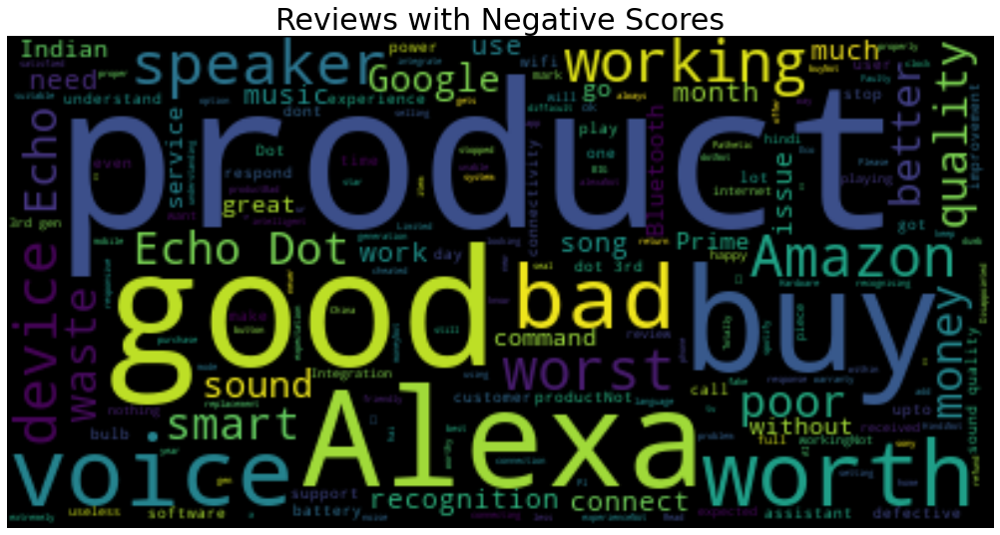

In [87]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(211)
ax1.imshow(wordcloud_negative,interpolation='bilinear')
ax1.axis("off")
ax1.set_title('Reviews with Negative Scores',fontsize=30)

## Word cloud for "positive reviews" and High Ratings

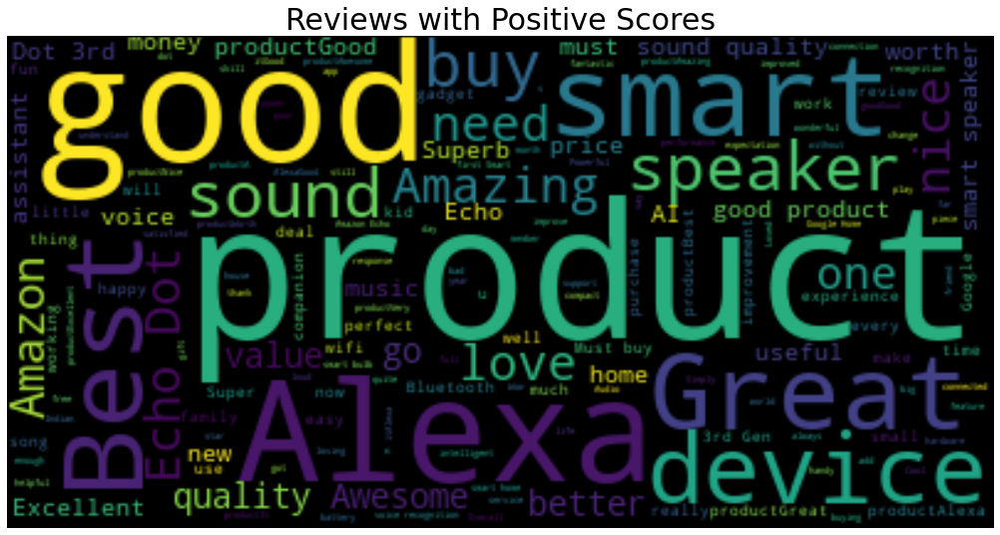

In [88]:
fig = plt.figure(figsize=(20,20))
ax2 = fig.add_subplot(212)
ax2.imshow(wordcloud_positive,interpolation='bilinear')
ax2.axis("off")
ax2.set_title('Reviews with Positive Scores',fontsize=30)
plt.show()

In [89]:
df1

,Name,Stars,HelpfulVotes,Title,Review,Polarity,review_len,word_count,avg_word_len,Sentiment(Stars),sentiment(Polarity)
0,Parag,1,2248,Very poor sound recognition.,It definitely has better speakers than Eco Dot...,-0.227191,946,170,4.570588,Negative,Negative
1,Chinmaya D.,5,2965,My first Smart Speaker,This was launched on 11th and I got the produc...,0.248634,840,157,4.356688,Positive,Positive
2,Vishnu,5,962,it’s amazing just read my review,The media could not be loaded. Such an amazin...,0.177778,496,97,4.113402,Positive,Positive
3,Rajiv p.,4,647,Stunner!,It's totally Paisa wasoolSpeaker is loudShe li...,0.062500,187,32,4.875000,Positive,Positive
4,Aritra Daspoddar,4,233,A real competition to Google Home mini,At first i was confused which one to buy - Goo...,0.153869,1220,209,4.842105,Positive,Positive
...,...,...,...,...,...,...,...,...,...,...,...
4995,vanisree vanamali,5,0,Excellent,Excellent,1.000000,9,1,9.000000,Positive,Positive
4996,asmit gangil,5,0,Amazing product,It's been 9 months and it's working smooth wit...,0.100000,63,11,4.818182,Positive,Positive
4997,Mueem,3,0,Missing some features. OVERALL good product,Please add a feature to connect multiple devic...,0.000000,116,19,5.157895,Neutral,Neutral
4998,Yogesh gowda,5,0,Best for Indians but,It still fails to make Cellular calls n much m...,0.000000,52,10,4.300000,Positive,Neutral


In [90]:
data=df1.iloc[:,[4,-1]]
data

,Review,sentiment(Polarity)
0,It definitely has better speakers than Eco Dot...,Negative
1,This was launched on 11th and I got the produc...,Positive
2,The media could not be loaded. Such an amazin...,Positive
3,It's totally Paisa wasoolSpeaker is loudShe li...,Positive
4,At first i was confused which one to buy - Goo...,Positive
...,...,...
4995,Excellent,Positive
4996,It's been 9 months and it's working smooth wit...,Positive
4997,Please add a feature to connect multiple devic...,Neutral
4998,It still fails to make Cellular calls n much m...,Neutral


In [91]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
data['sentiment(Polarity)']=le.fit_transform(data['sentiment(Polarity)'])
data

,Review,sentiment(Polarity)
0,It definitely has better speakers than Eco Dot...,0
1,This was launched on 11th and I got the produc...,2
2,The media could not be loaded. Such an amazin...,2
3,It's totally Paisa wasoolSpeaker is loudShe li...,2
4,At first i was confused which one to buy - Goo...,2
...,...,...
4995,Excellent,2
4996,It's been 9 months and it's working smooth wit...,2
4997,Please add a feature to connect multiple devic...,1
4998,It still fails to make Cellular calls n much m...,1


In [92]:
trans_data=data.Review.array
trans_data

<PandasArray>
[                                                                                                                                                                                                                                                                                  "It definitely has better speakers than Eco Dot Gen2 and Google Home Mini, but sound recognition is very poor compared to Google Home Mini or even previous Eco Dot. Maybe it has something to do with cost cutting and Amazon going with only 4 far field microphones instead of 7.But due to it's poor recognition, it takes a lot of time, sometimes even minutes and does nothing... Which definitely takes away the experience. Unfortunately I can't return it... But I think Google Home Mini is miles ahead and better with all the new updates to Google Assistant (Sleep assist and stuff).Update as on 27th April 2019: Software has gone from bad to worst. It plays certain songs again and again, doesn't let you skip. R

## 8. Named Entity Recognition
* The key aim to performing Named Entity Recognition on a piece of text is to extract key information from the text.
* named entities in text into predefined categories such as names of persons, organizations, locations, etc.

In [93]:
# Parts Of Speech (POS) Tagging
nlp=spacy.load('en_core_web_sm')

one_block=doc
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [94]:
for token in doc_block[100:200]:
    print(token,token.pos_)

, PUNCT
yell INTJ
alexa PROPN
understand NOUN
want VERB
tell NOUN
understand VERB
said VERB
. PUNCT
and CCONJ
expect VERB
support NOUN
amazon NOUN
eco ADP
devices NOUN
, PUNCT
/ PUNCT
bad.this PROPN
launched VERB
11th NOUN
i PRON
got VERB
product NOUN
12th NOUN
. PUNCT
plus CCONJ
reduced VERB
price NOUN
due ADJ
sale NOUN
nice ADJ
smart PROPN
bulb PROPN
500 NUM
rupees NOUN
. PUNCT
overall ADV
i PRON
think VERB
super ADJ
value NOUN
money NOUN
. PUNCT
i PRON
used VERB
smart ADJ
speaker NOUN
i PRON
happy ADJ
purchase NOUN
. PUNCT
below ADP
observations NOUN
:1 PUNCT
. PUNCT
initially ADV
feels VERB
bit ADV
weird ADJ
talking VERB
speaker NOUN
get AUX
used VERB
time.2 PROPN
. PUNCT
the DET
sound ADJ
quality NOUN
pretty ADV
good ADJ
. PUNCT
you PRON
get VERB
good ADJ
depth NOUN
sound ADJ
decent ADJ
bass.3 NOUN
. PUNCT
several ADJ
skills NOUN
available ADJ
definitely ADV
find VERB
useful ADJ
. PUNCT
for ADP
example NOUN
adding VERB
stuff NOUN
shopping NOUN
list NOUN
setting VERB
reminder.4 PRO

In [95]:
blob = TextBlob(str(df1['Review']))
blob

TextBlob("0       It definitely has better speakers than Eco Dot...
1       This was launched on 11th and I got the produc...
2       The media could not be loaded.  Such an amazin...
3       It's totally Paisa wasoolSpeaker is loudShe li...
4       At first i was confused which one to buy - Goo...
                              ...                        
4995                                            Excellent
4996    It's been 9 months and it's working smooth wit...
4997    Please add a feature to connect multiple devic...
4998    It still fails to make Cellular calls n much m...
4999                           given as a gift to brother
Name: Review, Length: 5000, dtype: object")

### Count of POS tags

In [96]:
pos_df = pd.DataFrame(blob.tags, columns= ['words','pos'])
pos_df = pos_df['pos'].value_counts()
pos_df

CD     14
NN     14
JJ      8
VB      6
VBZ     6
NNP     6
DT      6
PRP     6
RB      5
VBN     5
TO      4
NNS     4
IN      4
VBD     3
CC      2
MD      1
WDT     1
JJR     1
VBG     1
Name: pos, dtype: int64

In [97]:
pos_df.iplot(kind = 'bar' )

## POS tags with specification

### Abbreviation

* CC -coordinating conjunction
* CD -	cardinal digit
* DT -	determiner
* EX -	existential there
* FW - foreign word
* IN -	preposition/subordinating conjunction
* JJ -	This NLTK POS Tag is an adjective (large)
* JJR -	adjective, comparative (larger)
* JJS -	adjective, superlative (largest)
* LS -	list market
* MD -	modal (could, will)
* NN -	noun, singular (cat, tree)
* NNS -	noun plural (desks)
* NNP -	proper noun, singular (sarah)
* NNPS -	proper noun, plural (indians or americans)
* PDT - 	predeterminer (all, both, half)
* POS - 	possessive ending (parent\ ‘s)
* PRP - 	personal pronoun (hers, herself, him, himself)
* PRP - 	possessive pronoun (her, his, mine, my, our )
* RB - adverb (occasionally, swiftly)
* RBR - 	adverb, comparative (greater)
* RBS - adverb, superlative (biggest)
* RP - 	particle (about)
* TO -	infinite marker (to)
* UH -	interjection (goodbye)
* VB -	verb (ask)
* VBG -	verb gerund (judging)
* VBD -	verb past tense (pleaded)
* VBN -	verb past participle (reunified)
* VBP -	verb, present tense not 3rd person singular(wrap)
* VBZ -	verb, present tense with 3rd person singular (bases)
* WDT -	wh-determiner (that, what)
* WP -	wh- pronoun (who)
* WRB -	wh- adverb (how)

## 9. Model Building

### CountVectorizer:
   * It does breaking down a sentence or paragraph or any text into words

In [98]:
from sklearn.feature_extraction.text import CountVectorizer
cv= CountVectorizer(max_features=1420)

In [99]:
#Splitting the data into x & y variables
x=cv.fit_transform(trans_data)
y= data.iloc[:,-1].values
X =x.toarray()

In [100]:
#Splitting the data into train and test parts
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y ,test_size=0.2,random_state=0)

## Naive Bayes

In [101]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(x_train,y_train)

GaussianNB()

In [102]:
y_train_pred = classifier.predict(x_train)
y_train_pred.shape

(4000,)

In [103]:
y_test_pred = classifier.predict(x_test)
y_test_pred.shape

(1000,)

In [104]:
from sklearn.metrics import confusion_matrix,accuracy_score
cm = confusion_matrix(y_test,y_test_pred)
print(cm)

[[ 90   6  39]
 [ 26  22   9]
 [337  69 402]]


In [105]:
accuracy_score(y_train,y_train_pred)

0.58925

In [106]:
accuracy_score(y_test,y_test_pred)

0.514

### Inference:
  * Training Accuracy : **59%**
  * Testing Accuracy : **51%**

## Logistic Regression

In [107]:
from sklearn.linear_model import LogisticRegression
logistic_model = LogisticRegression()
logistic_model.fit(x_train,y_train)

LogisticRegression()

In [108]:
y_pred_train = logistic_model.predict(x_train)
y_pred_test = logistic_model.predict(x_test)

In [109]:
accuracy_score(y_train,y_pred_train)

0.988

In [110]:
accuracy_score(y_test,y_pred_test)

0.893

In [111]:
print('Confusion Matrix of training data:\n',confusion_matrix(y_train,y_pred_train))

Confusion Matrix of training data:
 [[ 496    4   24]
 [   2  276   10]
 [   5    3 3180]]


In [112]:
print('Confusion Matrix of testing data:\n',confusion_matrix(y_test,y_pred_test))

Confusion Matrix of testing data:
 [[ 84   8  43]
 [  4  38  15]
 [ 29   8 771]]


### Inference:
   * Training Accuracy: **98%**
   * Testing Accuracy: **90%**

In [113]:
!pip install xgboost

In [114]:
# fit xgboost on an imbalanced classification dataset
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBClassifier

In [115]:
# generate dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
        n_clusters_per_class=2, weights=[0.99], flip_y=0, random_state=7)

In [116]:
# define model
model = XGBClassifier()

In [117]:
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

In [118]:
# evaluate model
scores = cross_val_score(model, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
scores

array([0.88828283, 0.94969697, 0.98686869, 0.98030303, 0.97373737,
       0.98080808, 0.92378788, 0.93590909, 0.95161616, 0.98343434,
       0.98313131, 0.96833333, 0.96424242, 0.98939394, 0.92035354,
       0.96919192, 0.95555556, 0.95227273, 0.97585859, 0.96141414,
       0.99131313, 0.96419192, 0.93464646, 0.94292929, 0.97141414,
       0.97424242, 0.92479798, 0.9879798 , 0.96363636, 0.96631313])

In [119]:
# summarize performance
print('Mean ROC AUC: %.5f' % mean(scores))

Mean ROC AUC: 0.96052


# END